<a href="https://colab.research.google.com/github/yrodriguezmd/Surgical_instruments/blob/main/Models/notebooks/Student_models/Model_M1_oct25/Model_M1_oct25.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Fine-tune a pretrained VFNet using Set_1_8 then do Inference on Unlabelled Set_U (n= **) to generate pseudolabels.

Needed to restart runtime due to javascript errors/ high RAM demand

In [ ]:
!wget https://raw.githubusercontent.com/airctic/icevision/master/install_colab.sh
!bash install_colab.sh

In [2]:
exit()

In [1]:
import icevision

INFO     - The mmdet config folder already exists. No need to downloaded it. Path : /root/.icevision/mmdetection_configs/mmdetection_configs-2.16.0/configs | icevision.models.mmdet.download_configs:download_mmdet_configs:18


In [2]:
from icevision.all import *
print('icevision v',icevision.__version__)
print('torch v',torch.__version__)
print('torchvision v',torchvision.__version__)

icevision v 0.10.0a1
torch v 1.9.0+cu111
torchvision v 0.10.0+cu111


In [ ]:
# contains labelled data
!git clone https://github.com/yrodriguezmd/Surgical_instruments.git

In [3]:
# contains unlabelled data
from google.colab import drive
drive.mount('/content/gdrive', force_remount = True)

Mounted at /content/gdrive


In [ ]:
!ls Surgical_instruments/Sets/Set_S/subsets/Set_1_7

notebooks  README.md  test  train  valid  whole_set


In [5]:
!ls gdrive/MyDrive/Surgical_instruments/Set_1_8.v1i.coco

README.dataset.txt  README.roboflow.txt  test  train  valid


Train Model_M_oct25

In [4]:
image_path = Path('gdrive/MyDrive/Surgical_instruments/Set_1_8.v1i.coco/train')
#image_path = Path('Surgical_instruments/Sets/Set_S/subsets/Set_1_7/train')

img_files = get_image_files(image_path)

img = PIL.Image.open(img_files[601]) ##
img = img.convert('RGB')

#img.to_thumb(150,150)

In [5]:
classes = ['Towel_clip', 'Castroviejo', 'Yankauer', 'Hemostat', 'Army_navy', 'Richardson', 'Potts', 'Iris', 'Bulldog', 'Forceps', 'Scalpel', 'Frazier', 'Needle', 'Weitlaner', 'Mayo_metz']
class_map = ClassMap(classes)
len(class_map)

16

Parse data

In [6]:
#path = Path('Surgical_instruments/Sets/Set_S/subsets/Set_1_7') # adjust if use git clone vs gdrive
path = Path('gdrive/MyDrive/Surgical_instruments/Set_1_8.v1i.coco')

train_parser = parsers.COCOBBoxParser(
    annotations_filepath = path/'train/Set_1_8_annotations.coco.json',
    img_dir = path/'train'
)

valid_parser = parsers.COCOBBoxParser(
    annotations_filepath = path/'valid/Set_1_8_annotations.coco.json',
    img_dir = path/'valid'
)

In [ ]:
# dataset already split in annotation tool, maintain grouping

whole = SingleSplitSplitter()

train_records, *_ = train_parser.parse(data_splitter = whole)

valid_records, *_ = valid_parser.parse(data_splitter = whole)

In [ ]:
show_records(train_records[0:3],ncols=3, font_size=30, label_color = '#ffff00')

In [ ]:
show_records(valid_records[0:3],ncols=3, font_size=30, label_color = '#ffff00')

In [10]:
presize = 512
image_size = 384

train_tfms = tfms.A.Adapter([*tfms.A.aug_tfms(size=presize), tfms.A.Normalize()])
valid_tfms = tfms.A.Adapter([*tfms.A.resize_and_pad(size=image_size), tfms.A.Normalize()])

In [11]:
train_ds = Dataset(train_records, train_tfms) ## Set_1_8
valid_ds = Dataset(valid_records, valid_tfms)

In [ ]:
metrics = [COCOMetric(metric_type=COCOMetricType.bbox)]

from icevision.models.checkpoint import *

model_type = models.mmdet.vfnet ##
backbone = model_type.backbones.resnet50_fpn_mstrain_2x##

model = model_type.model(backbone=backbone(pretrained=True), num_classes=len(class_map),)# **extra_args)

In [15]:
# manual upload model
#from google.colab import files
#files.upload()

In [ ]:
#from icevision.models import *

#checkpoint_path = 'Model_M_oct23_vf_mAP52.5.pth'

#checkpoint_and_model = model_from_checkpoint(checkpoint_path)
#model = checkpoint_and_model['model'] # Model M
#model.train()

In [13]:
train_dl = model_type.train_dl(train_ds, batch_size = 16, num_workers = 4,
                               shuffle=True)
valid_dl = model_type.valid_dl(valid_ds, batch_size=16, num_workers = 4,
                               shuffle=False)

In [14]:
#difficult with erratic connection
#from fastai.callback.wandb import *

#wandb.init(project = 'Surgical_instruments', name = 'Model_M_oct25', ##
#           reinit = True)

In [15]:
learn = model_type.fastai.learner(dls = [train_dl, valid_dl],
                                  model = model, metrics = metrics,)
                                  #cbs = WandbCallback(  )) ##

In [ ]:
learn.lr_find()

In [ ]:
learn.fine_tune(30,3e-04)##

In [18]:
from icevision.models import *

checkpoint_path = 'Model_M_oct25_vf_mAP60.9.pth' #30epochs

save_icevision_checkpoint(model, 
                        model_name='mmdet.vfnet', ## 
                        backbone_name='resnet50_fpn_mstrain_2x', ##
                        classes =  train_parser.class_map.get_classes(), 
                        img_size=image_size, 
                        filename=checkpoint_path,
                        meta={'icevision_version': '0.9.1'})

# download model

In [19]:
import matplotlib.pyplot as plt
def plot_metrics(learn, title):
  plt.plot(L(learn.recorder.values).itemgot())
  plt.xlabel('epoch')
  plt.ylabel('mAP (green), Loss (blue, orange)')
  plt.title(title)
  plt.text(0,-0.2, 
       'Legend: mAP(green), train_loss(blue), valid_loss(orange')
  plt.ylim(0,1);

In [ ]:
plot_metrics(learn, 'Model_M_oct25, ')

In [21]:
import matplotlib.pyplot as plt
def plot_metrics_extend(learn, title):
  plt.plot(L(learn.recorder.values).itemgot())
  plt.xlabel('epoch')
  plt.ylabel('mAP (green), Loss (blue, orange)')
  plt.title(title)
  plt.text(0,-0.2, 
       'Legend: mAP(green), train_loss(blue), valid_loss(orange')
  plt.ylim(0,2);

In [ ]:
plot_metrics_extend(learn, 'Model_M_oct25')

In [ ]:
learn.fine_tune(10,3e-04)## 40

In [ ]:
learn.fine_tune(10,3e-04)## 50

In [ ]:
learn.fine_tune(10,3e-04)## 60

In [26]:
from icevision.models import *

checkpoint_path = 'Model_M_oct25b_vf_mAP0.598.pth' #**epochs

save_icevision_checkpoint(model, 
                        model_name='mmdet.vfnet', ## 
                        backbone_name='resnet50_fpn_mstrain_2x', ##
                        classes =  train_parser.class_map.get_classes(), 
                        img_size=image_size, 
                        filename=checkpoint_path,
                        meta={'icevision_version': '0.9.1'})

# download model

In [27]:
import matplotlib.pyplot as plt
def plot_metrics_extend(learn, title):
  plt.plot(L(learn.recorder.values).itemgot())
  plt.xlabel('epoch')
  plt.ylabel('mAP (green), Loss (blue, orange)')
  plt.title(title)
  plt.text(0,-0.2, 
       'Legend: mAP(green), train_loss(blue), valid_loss(orange')
  plt.ylim(0,2);

In [ ]:
plot_metrics_extend(learn, 'Model_M_oct25b')

In [ ]:
model_type.show_results(model, valid_ds)

In [ ]:
model_type.show_results(model, valid_ds)

Inference using Set_S test_set

In [ ]:
model.eval()

In [ ]:
#path = Path('Surgical_instruments/Sets/Set_S/subsets/Set_1_7') # adjust if use git clone vs gdrive
path = Path('gdrive/MyDrive/Surgical_instruments/Set_1_8.v1i.coco')

test_parser = parsers.COCOBBoxParser(
    annotations_filepath = path/'test/Set_1_8_annotations.coco.json',
    #annotations_filepath = path/'train/Set_1_5_annotations.coco.json',
    #img_dir = path/'train'
    img_dir = path/'test')

whole = SingleSplitSplitter()

test_records, *_ = test_parser.parse(data_splitter = whole)

#show_records(test_records[0:3],ncols=3, font_size=30, label_color = '#ffff00')

In [33]:
classes = ['Towel_clip', 'Castroviejo', 'Yankauer', 'Hemostat', 'Army_navy', 'Richardson', 'Potts', 'Iris', 'Bulldog', 'Forceps', 'Scalpel', 'Frazier', 'Needle', 'Weitlaner', 'Mayo_metz']
class_map = ClassMap(classes)

In [34]:
img_size = 384 

valid_tfms = tfms.A.Adapter([*tfms.A.resize_and_pad(img_size), tfms.A.Normalize()])

#infer_ds = Dataset.from_images(imgs_array, valid_tfms, class_map = class_map)
infer_ds = Dataset(test_records, valid_tfms)#, class_map = class_map)

In [ ]:
infer_dl = model_type.infer_dl(infer_ds, 
                               batch_size=4, shuffle=False)

preds_saved = model_type.predict_from_dl(model, infer_dl,
                                          keep_images=True, 
                                         detection_threshold = 0.5) ##

In [ ]:
#test
show_preds(preds = preds_saved[0:10])
# with detection threshold 0.5

In [ ]:
show_preds(preds = preds_saved[10:20])

Do inference on Set_U to generate pseudolabels.

In [ ]:
!ls gdrive/MyDrive/Surgical_instruments
# Set_U with 5569 images

Models		 Set_1_3.v1i.coco  Set_2.v1i.coco  Set_U2
pseudolabels	 Set_1_5.v1i.coco  Set_U	   Set_U3
retained_images  Set_1.v1i.coco    Set_U1


In [ ]:
images = Path('gdrive/MyDrive/Surgical_instruments/Set_U')

img_files = get_image_files(images)

img = PIL.Image.open(img_files[5501])
#img = img.convert('RGB')

img.to_thumb(150,150)

In [40]:
# same classes
images = Path('gdrive/MyDrive/Surgical_instruments/Set_U')

img_files = get_image_files(images)

imgs_array = [PIL.Image.open(file) for file in img_files]

imgs_array = [image.convert('RGB') for image in imgs_array]

img_size = 384 

valid_tfms = tfms.A.Adapter([*tfms.A.resize_and_pad(img_size), tfms.A.Normalize()])

infer_ds = Dataset.from_images(imgs_array, valid_tfms, class_map = class_map)

/usr/local/lib/python3.7/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


In [ ]:
infer_dl = model_type.infer_dl(infer_ds,## 
                               batch_size=4, shuffle=False)

preds_saved = model_type.predict_from_dl(model, infer_dl,
                                          keep_images=True, 
                                         detection_threshold = 0.5)

In [ ]:
show_preds (preds = preds_saved[0:10])

In [ ]:
show_preds (preds = preds_saved[10:20])

In [44]:
# temporary
from google.colab import files
files.download('Model_M_oct25b_vf_mAP0.598.pth') #60epochs

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [45]:
files.download('Model_M_oct25_vf_mAP60.9.pth') #30epochs

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Generate annotation file

In [46]:
for pred in preds_saved:
  pred.add_component(FilepathRecordComponent())

for _ in range(len(preds_saved)): 
  preds_saved[_].set_filepath(img_files[_]) 

conv = convert_preds_to_coco_style(preds_saved) 

In [ ]:
conv.items()

dict_items([('images', [{'id': 0, 'file_name': 'Unlabelled01073.jpg', 'width': 384, 'height': 384}, {'id': 1, 'file_name': 'Unlabelled01074.jpg', 'width': 384, 'height': 384}, {'id': 2, 'file_name': 'Unlabelled01075.jpg', 'width': 384, 'height': 384}, {'id': 3, 'file_name': 'Unlabelled01076.jpg', 'width': 384, 'height': 384}, {'id': 4, 'file_name': 'Unlabelled01077.jpg', 'width': 384, 'height': 384}, {'id': 5, 'file_name': 'Unlabelled01078.jpg', 'width': 384, 'height': 384}, {'id': 6, 'file_name': 'Unlabelled01079.jpg', 'width': 384, 'height': 384}, {'id': 7, 'file_name': 'Unlabelled01080.jpg', 'width': 384, 'height': 384}, {'id': 8, 'file_name': 'Unlabelled01081.jpg', 'width': 384, 'height': 384}, {'id': 9, 'file_name': 'Unlabelled01082.jpg', 'width': 384, 'height': 384}, {'id': 10, 'file_name': 'Unlabelled01083.jpg', 'width': 384, 'height': 384}, {'id': 11, 'file_name': 'Unlabelled01084.jpg', 'width': 384, 'height': 384}, {'id': 12, 'file_name': 'Unlabelled01085.jpg', 'width': 384, '

In [47]:
add_info = {
    "info": {
        "year": "2021",
        "version": "1",
        "description": "Exported from roboflow.ai",
        "contributor": "",
        "url": "https://public.roboflow.ai/object-detection/undefined",
        "date_created": "2021-10-05T20:13:09+00:00"
    },
    "licenses": [
        {
            "id": 1,
            "url": "https://creativecommons.org/licenses/by/4.0/",
            "name": "CC BY 4.0"
        }
    ],
    "categories": [
        {
            "id": 0,
            "name": "instruments",
            "supercategory": "none"
        },
        {
            "id": 1,
            "name": "Army_navy",
            "supercategory": "Retractor"
        },
        {
            "id": 2,
            "name": "Bulldog",
            "supercategory": "Clamp"
        },
        {
            "id": 3,
            "name": "Castroviejo",
            "supercategory": "Needle_holder"
        },
        {
            "id": 4,
            "name": "Forceps",
            "supercategory": "Forceps"
        },
        {
            "id": 5,
            "name": "Frazier",
            "supercategory": "Suction"
        },
        {
            "id": 6,
            "name": "Hemostat",
            "supercategory": "Clamp"
        },
        {
            "id": 7,
            "name": "Iris",
            "supercategory": "Scissors"
        },
       {
            "id": 8,
            "name": "Mayo_metz",
            "supercategory": "Scissors"
        },
        {
            "id": 9,
            "name": "Needle",
            "supercategory": "Needle"
        },
        {
            "id": 10,
            "name": "Potts",
            "supercategory": "Scissors"
        },
        {
            "id": 11,
            "name": "Richardson",
            "supercategory": "Retractor"
        },
        {
            "id": 12,
            "name": "Scalpel",
            "supercategory": "Scalpel"
        },
        {
            "id": 13,
            "name": "Towel_clip",
            "supercategory": "Clamp"
        },
        {
            "id": 14,
            "name": "Weitlaner",
            "supercategory": "Retractor"
        },
        {
            "id": 15,
            "name": "Yankauer",
            "supercategory": "Suction"
        }
    ]
}

In [48]:
pseudo_U = {**add_info, **conv} ##

f = open('pseudo_U.json','w') ##
f.write(str(pseudo_U)) ##
f.close()
##  edit ' to ": pseudo_U_.json 
##    --> challenging with big file, however, quotations necessary

Parse labelled and pseudolabelled data.

In [ ]:
#labelled data
! git clone https://github.com/yrodriguezmd/Surgical_instruments.git

In [50]:
!ls gdrive/MyDrive/Surgical_instruments/Set_1_8.v1i.coco

README.dataset.txt  README.roboflow.txt  test  train  valid


In [4]:
# Use Set_1_8 labelled data
#labelled_path = Path('Surgical_instruments/Sets/Set_S/subsets/Set_1_7')
labelled_path = Path('gdrive/MyDrive/Surgical_instruments/Set_1_8.v1i.coco')
pseudolabelled_path = Path('gdrive/MyDrive/Surgical_instruments/Set_U')

lab_train_parser = parsers.COCOBBoxParser(
    annotations_filepath = labelled_path/'train/Set_1_8_annotations.coco.json',
    img_dir = labelled_path/'train'
)

ps_train_parser = parsers.COCOBBoxParser(
    annotations_filepath = 'pseudo_U_oct25.json', ## 
    img_dir = pseudolabelled_path
)

valid_parser = parsers.COCOBBoxParser(
    annotations_filepath = labelled_path/'valid/Set_1_8_annotations.coco.json',
    img_dir = labelled_path/'valid'
)

In [5]:
whole = SingleSplitSplitter()

train_records, *_ = lab_train_parser.parse(data_splitter = whole)

  0%|          | 0/2106 [00:00<?, ?it/s]

INFO     - Autofixing records | icevision.parsers.parser:parse:122


  0%|          | 0/971 [00:00<?, ?it/s]

In [6]:
valid_records, *_ = valid_parser.parse(data_splitter = whole)

  0%|          | 0/504 [00:00<?, ?it/s]

INFO     - Autofixing records | icevision.parsers.parser:parse:122


  0%|          | 0/277 [00:00<?, ?it/s]

In [ ]:
train_records_ps, *_ = ps_train_parser.parse(data_splitter = whole)

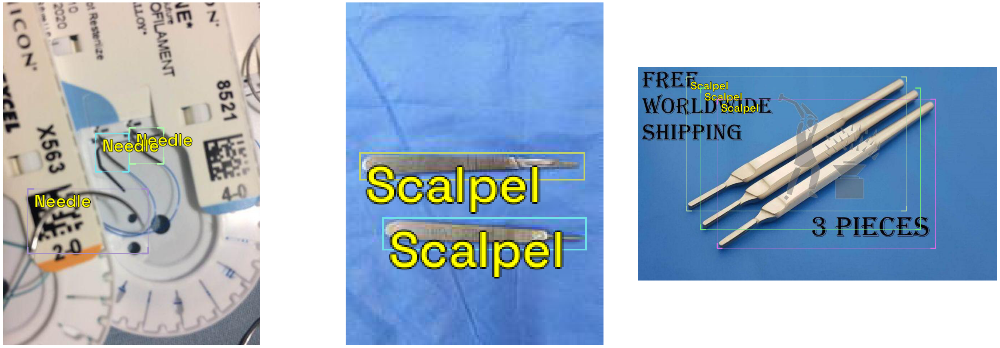

In [8]:
show_records(train_records[0:3],ncols=3, font_size=30, label_color = '#ffff00')

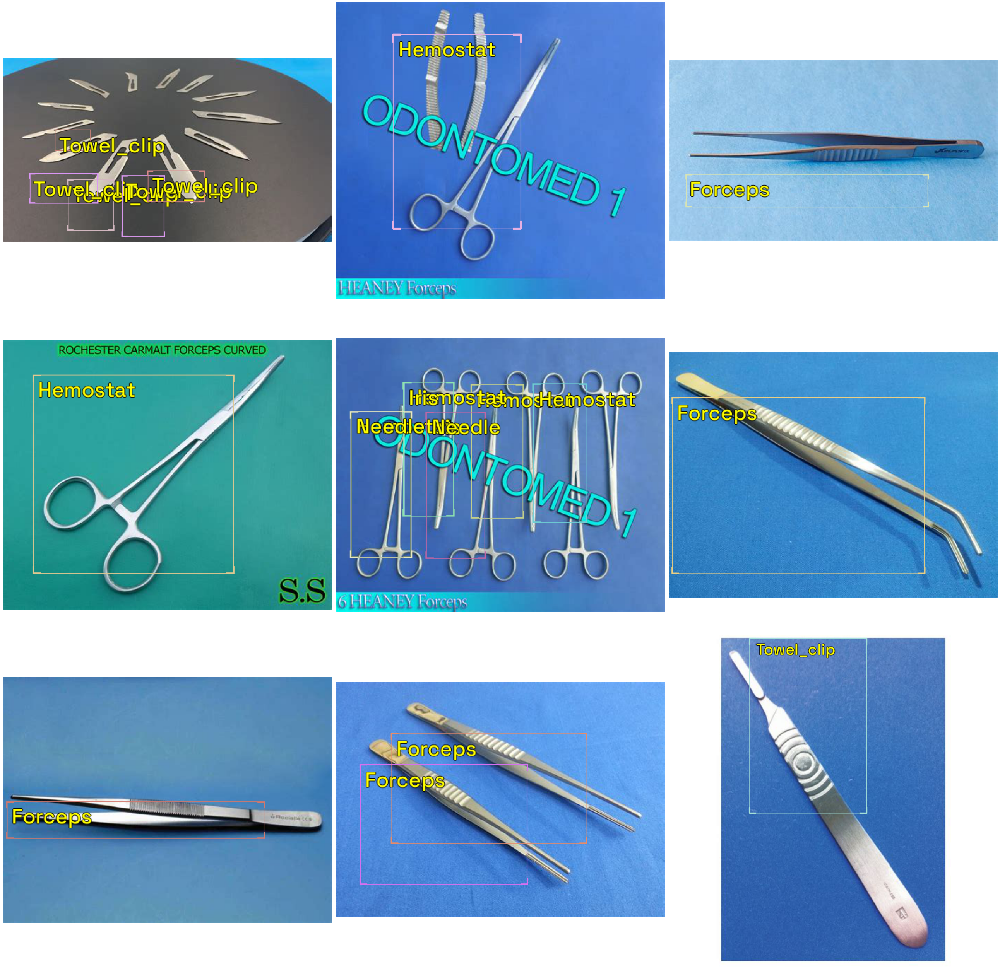

In [9]:
show_records(train_records_ps[0:9],ncols=3, font_size=30, label_color = '#ffff00')

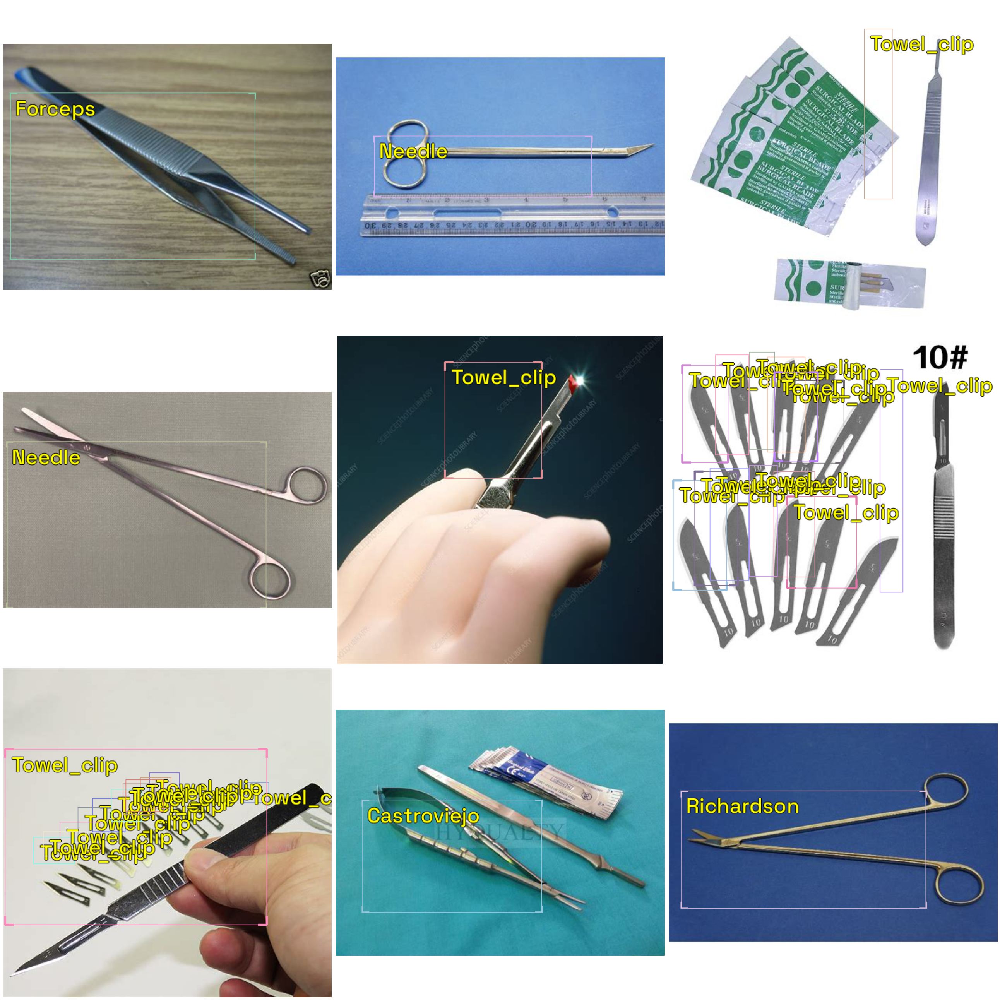

In [10]:
show_records(train_records_ps[9:18],ncols=3, font_size=30, label_color = '#ffff00')

Merge labelled records and pseudolabelled records

In [11]:
merged_train_records = torch.utils.data.ConcatDataset([train_records, train_records_ps])
print(len(train_records))
print(len(train_records_ps))
print(len(merged_train_records))

971
5311
6282


In [59]:
N = 5560 # Set_U
1- ( (N - len(train_records_ps)) / N)
# 96% of the unlabelled images have pseudolabels

0.9552158273381295

Retained images

In [ ]:
Set_U_a = [] # retained images (no pseudolabels)
for x in range(len(preds_saved)):
  if preds_saved[x].pred.detection.labels ==[]:
    Set_U_a.append(preds_saved[x].pred.common.filepath)

In [ ]:
Set_U_a[0]

Path('gdrive/MyDrive/Surgical_instruments/Set_U2/Unlabelled02558.jpg')

In [63]:
# keep for records
f = open('Set_U_a_oct25','w') 
f.write(str(Set_U_a)) 
f.close()
# download locally

In [64]:
imgs_retained = [PIL.Image.open(file) for file in Set_U_a]

retained_ds = Dataset.from_images(imgs_retained, valid_tfms, class_map = class_map)

retained_ds

<Dataset with 279 items>

Train student model Model_M1_oct25 using merged labelled and pseudolabelled data (merged_train_records).

In [13]:
presize = 512
image_size = 384

train_tfms = tfms.A.Adapter([*tfms.A.aug_tfms(size=presize), tfms.A.Normalize()])
valid_tfms = tfms.A.Adapter([*tfms.A.resize_and_pad(size=image_size), tfms.A.Normalize()])

In [14]:
train_ds = Dataset(merged_train_records, train_tfms) ## Set_S labelled + Set_U pseudolabels
valid_ds = Dataset(valid_records, valid_tfms)

In [15]:
metrics = [COCOMetric(metric_type=COCOMetricType.bbox)]

from icevision.models.checkpoint import *

model_type = models.mmdet.vfnet ##
backbone = model_type.backbones.resnet50_fpn_mstrain_2x##

#model = model_type.model(backbone=backbone(pretrained=True), num_classes=len(class_map),)# **extra_args)

In [ ]:
from icevision.models import *

checkpoint_path = 'Model_M_oct25_vf_mAP60.9.pth' #30epochs

checkpoint_and_model = model_from_checkpoint(checkpoint_path)
model = checkpoint_and_model['model'] # Model M
model.train()

In [17]:
train_dl = model_type.train_dl(train_ds, batch_size = 16, num_workers = 4,
                               shuffle=True)
valid_dl = model_type.valid_dl(valid_ds, batch_size=16, num_workers = 4,
                               shuffle=False)

In [70]:
#from fastai.callback.wandb import *

#wandb.init(project = 'Surgical_instruments', name = 'Model_M1_oct24', ##
#           reinit = True)

In [18]:
learn = model_type.fastai.learner(dls = [train_dl, valid_dl],
                                  model = model, metrics = metrics,)
                                  #cbs = WandbCallback(  )) ##

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
  return torch.max_pool2d(input, kernel_size, stride, padding, dilation, ceil_mode)
/usr/local/lib/python3.7/dist-packages/mmdet/core/anchor/anchor_generator.py:324: UserWarning: ``grid_anchors`` would be deprecated soon. Please use ``grid_priors`` 
  warnings.warn('``grid_anchors`` would be deprecated soon. '
/usr/local/lib/python3.7/dist-packages/mmdet/core/anchor/anchor_generator.py:361: UserWarning: ``single_level_grid_anchors`` would be deprecated soon. Please use ``single_level_grid_priors`` 
  '``single_level_grid_anchors`` would be deprecated soon. '
/usr/local/lib/python3.7/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in

SuggestedLRs(valley=0.0002754228771664202)

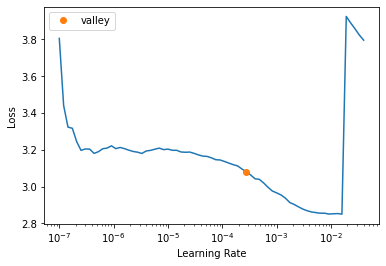

In [19]:
learn.lr_find()
#### unable to see output, had to restart kernel

In [20]:
#merged
learn.fine_tune(10, 3e-04 )

epoch,train_loss,valid_loss,COCOMetric,time
0,2.058627,1.790471,0.443610,05:54


/usr/local/lib/python3.7/dist-packages/mmdet/core/anchor/anchor_generator.py:324: UserWarning: ``grid_anchors`` would be deprecated soon. Please use ``grid_priors`` 
  warnings.warn('``grid_anchors`` would be deprecated soon. '
/usr/local/lib/python3.7/dist-packages/mmdet/core/anchor/anchor_generator.py:361: UserWarning: ``single_level_grid_anchors`` would be deprecated soon. Please use ``single_level_grid_priors`` 
  '``single_level_grid_anchors`` would be deprecated soon. '
/usr/local/lib/python3.7/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.7/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.7/dist-packages/PIL/Image.py:976: UserWarning: P

epoch,train_loss,valid_loss,COCOMetric,time
0,1.964192,1.629002,0.514743,06:28
1,1.981629,1.638541,0.465552,06:26


/usr/local/lib/python3.7/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.7/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.7/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.7/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.7/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency e

epoch,train_loss,valid_loss,COCOMetric,time
0,1.964192,1.629002,0.514743,06:28
1,1.981629,1.638541,0.465552,06:26
2,1.971013,1.745945,0.390063,06:27
3,1.919575,1.710383,0.447199,06:26
4,1.888251,1.708429,0.440391,06:27
5,1.828872,1.774596,0.416979,06:26
6,1.783606,1.700599,0.409052,06:25
7,1.751422,1.713161,0.420349,06:25
8,1.729701,1.680984,0.425277,06:22
9,1.687385,1.675753,0.431793,06:22


/usr/local/lib/python3.7/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.7/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.7/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.7/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.7/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency e

Inference for Model_M1 using Set_U

In [24]:
# same classes
images = Path('gdrive/MyDrive/Surgical_instruments/Set_U')

img_files = get_image_files(images)

imgs_array = [PIL.Image.open(file) for file in img_files]

imgs_array = [image.convert('RGB') for image in imgs_array]

img_size = 384 

valid_tfms = tfms.A.Adapter([*tfms.A.resize_and_pad(img_size), tfms.A.Normalize()])

infer_ds = Dataset.from_images(imgs_array, valid_tfms, class_map = class_map)

/usr/local/lib/python3.7/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


In [27]:
infer_dl = model_type.infer_dl(infer_ds,## 
                               batch_size=4, shuffle=False)

preds_saved = model_type.predict_from_dl(model, infer_dl,
                                          keep_images=True, 
                                         detection_threshold = 0.5)

  0%|          | 0/1398 [00:00<?, ?it/s]

TypeError: ignored

In [ ]:
show_preds(preds = preds_saved[0:10]) 

In [ ]:
show_preds(preds = preds_saved[10:20]) 

Try train from pretrained-COCO VFNet

In [22]:
metrics = [COCOMetric(metric_type=COCOMetricType.bbox)]

from icevision.models.checkpoint import *

model_type = models.mmdet.vfnet ##
backbone = model_type.backbones.resnet50_fpn_mstrain_2x##

model = model_type.model(backbone=backbone(pretrained=True), num_classes=len(class_map),)# **extra_args)

TypeError: ignored

In [ ]:
train_dl = model_type.train_dl(train_ds, batch_size = 16, num_workers = 4,
                               shuffle=True)
valid_dl = model_type.valid_dl(valid_ds, batch_size=16, num_workers = 4,
                               shuffle=False)

In [ ]:
learn = model_type.fastai.learner(dls = [train_dl, valid_dl],
                                  model = model, metrics = metrics,)
                                  #cbs = WandbCallback(  )) ##

In [ ]:
learn.lr_find()

In [34]:
learn.fine_tune(10,3e-04) #20

Could not gather input dimensions


epoch,train_loss,valid_loss,COCOMetric,time
0,1.846381,1.921159,0.294221,05:09


/usr/local/lib/python3.7/dist-packages/mmdet/core/anchor/anchor_generator.py:324: UserWarning: ``grid_anchors`` would be deprecated soon. Please use ``grid_priors`` 
  warnings.warn('``grid_anchors`` would be deprecated soon. '
/usr/local/lib/python3.7/dist-packages/mmdet/core/anchor/anchor_generator.py:361: UserWarning: ``single_level_grid_anchors`` would be deprecated soon. Please use ``single_level_grid_priors`` 
  '``single_level_grid_anchors`` would be deprecated soon. '
/usr/local/lib/python3.7/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.7/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.7/dist-packages/PIL/Image.py:976: UserWarning: P

Could not gather input dimensions


epoch,train_loss,valid_loss,COCOMetric,time
0,1.797441,1.934728,0.296866,05:39
1,1.796072,1.922692,0.321810,05:39
2,1.835622,1.897978,0.329010,05:38
3,1.810558,1.937840,0.279534,05:39
4,1.783301,2.011286,0.261246,05:39
5,1.764099,1.948399,0.294219,05:38
6,1.681981,1.997352,0.286315,05:39
7,1.656735,1.962177,0.299263,05:39
8,1.630181,1.963421,0.302883,05:39
9,1.630165,1.967020,0.301676,05:38


/usr/local/lib/python3.7/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.7/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.7/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.7/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.7/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency e

In [35]:
learn.fine_tune(10,3e-04) #30

Could not gather input dimensions


epoch,train_loss,valid_loss,COCOMetric,time
0,1.722403,2.023585,0.259631,05:08


/usr/local/lib/python3.7/dist-packages/mmdet/core/anchor/anchor_generator.py:324: UserWarning: ``grid_anchors`` would be deprecated soon. Please use ``grid_priors`` 
  warnings.warn('``grid_anchors`` would be deprecated soon. '
/usr/local/lib/python3.7/dist-packages/mmdet/core/anchor/anchor_generator.py:361: UserWarning: ``single_level_grid_anchors`` would be deprecated soon. Please use ``single_level_grid_priors`` 
  '``single_level_grid_anchors`` would be deprecated soon. '
/usr/local/lib/python3.7/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.7/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.7/dist-packages/PIL/Image.py:976: UserWarning: P

Could not gather input dimensions


epoch,train_loss,valid_loss,COCOMetric,time
0,1.656124,1.982635,0.292620,05:39
1,1.692654,1.912515,0.325632,05:38
2,1.736463,1.999043,0.304022,05:38
3,1.694084,2.015368,0.266932,05:39
4,1.684374,2.069560,0.246541,05:39
5,1.685438,1.992677,0.284323,05:39
6,1.624701,2.029040,0.266556,05:38
7,1.591762,2.057722,0.277865,05:38
8,1.538045,2.087390,0.282492,05:39
9,1.515993,2.082501,0.282623,05:38


/usr/local/lib/python3.7/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.7/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.7/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.7/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.7/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency e

In [36]:
learn.fine_tune(10,3e-04) #40

Could not gather input dimensions


epoch,train_loss,valid_loss,COCOMetric,time
0,1.625090,2.047723,0.272443,05:08


/usr/local/lib/python3.7/dist-packages/mmdet/core/anchor/anchor_generator.py:324: UserWarning: ``grid_anchors`` would be deprecated soon. Please use ``grid_priors`` 
  warnings.warn('``grid_anchors`` would be deprecated soon. '
/usr/local/lib/python3.7/dist-packages/mmdet/core/anchor/anchor_generator.py:361: UserWarning: ``single_level_grid_anchors`` would be deprecated soon. Please use ``single_level_grid_priors`` 
  '``single_level_grid_anchors`` would be deprecated soon. '
/usr/local/lib/python3.7/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.7/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.7/dist-packages/PIL/Image.py:976: UserWarning: P

Could not gather input dimensions


epoch,train_loss,valid_loss,COCOMetric,time
0,1.556229,2.107989,0.275269,05:38
1,1.612093,2.048376,0.276740,05:38
2,1.619868,2.020731,0.299736,05:38
3,1.667983,2.035872,0.269747,05:38
4,1.614426,2.043621,0.256425,05:38
5,1.584917,2.057170,0.252072,05:38
6,1.521887,2.105126,0.248262,05:38
7,1.509213,2.095288,0.276082,05:38
8,1.452342,2.119781,0.262796,05:39
9,1.460943,2.118272,0.271012,05:38


/usr/local/lib/python3.7/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.7/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.7/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.7/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.7/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency e

In [ ]:
import matplotlib.pyplot as plt
def plot_metrics(learn, title):
  plt.plot(L(learn.recorder.values).itemgot())
  plt.xlabel('epoch')
  plt.ylabel('mAP (green), Loss (blue, orange)')
  plt.title(title)
  plt.text(0,-0.2, 
       'Legend: mAP(green), train_loss(blue), valid_loss(orange')
  plt.ylim(0,1);

In [ ]:
plot_metrics(learn, 'Model_M1_oct23')

In [37]:
import matplotlib.pyplot as plt
def plot_metrics(learn, title):
  plt.plot(L(learn.recorder.values).itemgot())
  plt.xlabel('epoch')
  plt.ylabel('mAP (green), Loss (blue, orange)')
  plt.title(title)
  plt.text(0,-0.2, 
       'Legend: mAP(green), train_loss(blue), valid_loss(orange')
  plt.ylim(0,2);

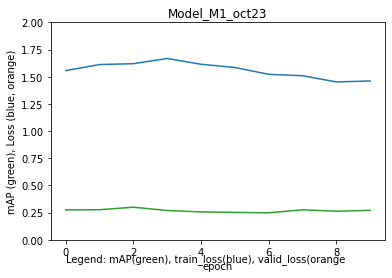

In [38]:
plot_metrics(learn, 'Model_M1_oct23')

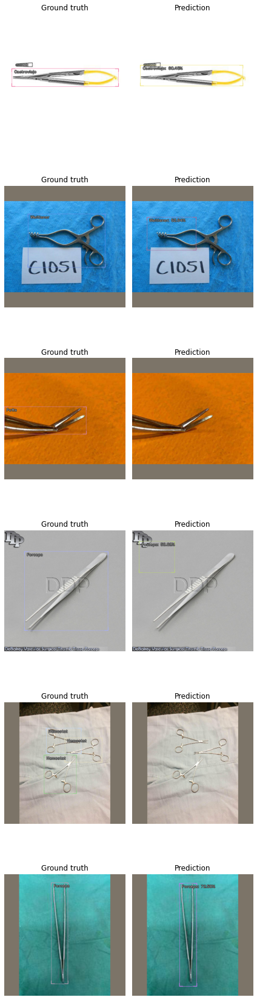

In [39]:
model_type.show_results(model, valid_ds)

In [51]:
from icevision.models import *

checkpoint_path = 'Model_M1_oct24_vf_mAP27.1.pth'

save_icevision_checkpoint(model, 
                        model_name='mmdet.vfnet', ## 
                        backbone_name='resnet50_fpn_mstrain_2x', ##
                        classes =  valid_parser.class_map.get_classes(), 
                        img_size=image_size, 
                        filename=checkpoint_path,
                        meta={'icevision_version': '0.9.1'})

# download model

Inference using Set_S test_set

In [ ]:
model.eval()

  0%|          | 0/185 [00:00<?, ?it/s]

INFO     - Autofixing records | icevision.parsers.parser:parse:122


  0%|          | 0/93 [00:00<?, ?it/s]

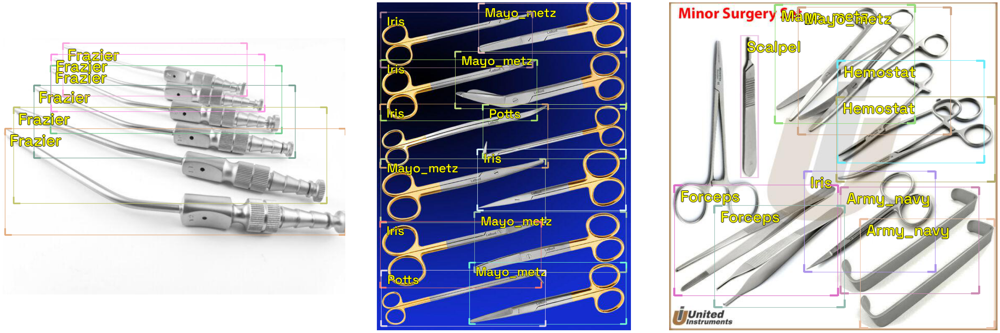

In [41]:
path = Path('Surgical_instruments/Sets/Set_S/subsets/Set_1_7') # adjust if use git clone vs gdrive

test_parser = parsers.COCOBBoxParser(
    annotations_filepath = path/'test/Set_1_7_annotations.coco.json',
    #annotations_filepath = path/'train/Set_1_5_annotations.coco.json',
    #img_dir = path/'train'
    img_dir = path/'test')

whole = SingleSplitSplitter()

test_records, *_ = test_parser.parse(data_splitter = whole)

show_records(test_records[0:3],ncols=3, font_size=30, label_color = '#ffff00')

In [42]:
classes = ['Towel_clip', 'Castroviejo', 'Yankauer', 'Hemostat', 'Army_navy', 'Richardson', 'Potts', 'Iris', 'Bulldog', 'Forceps', 'Scalpel', 'Frazier', 'Needle', 'Weitlaner', 'Mayo_metz']
class_map = ClassMap(classes)

In [43]:
img_size = 384 

valid_tfms = tfms.A.Adapter([*tfms.A.resize_and_pad(img_size), tfms.A.Normalize()])

#infer_ds = Dataset.from_images(imgs_array, valid_tfms, class_map = class_map)
infer_ds = Dataset(test_records, valid_tfms)#, class_map = class_map)

In [46]:
infer_dl = model_type.infer_dl(infer_ds, 
                               batch_size=4, shuffle=False)

preds_saved_test = model_type.predict_from_dl(model, infer_dl,
                                          keep_images=True, 
                                         detection_threshold = 0.5) ##

  0%|          | 0/24 [00:00<?, ?it/s]

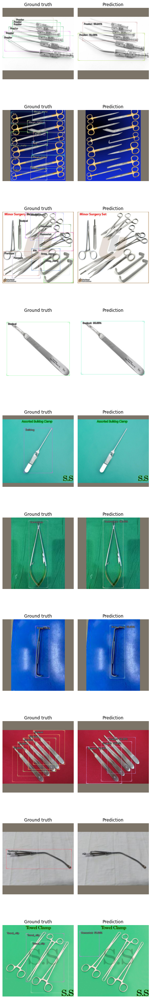

In [47]:
show_preds(preds = preds_saved_test[0:10])
# with detection threshold 0.5

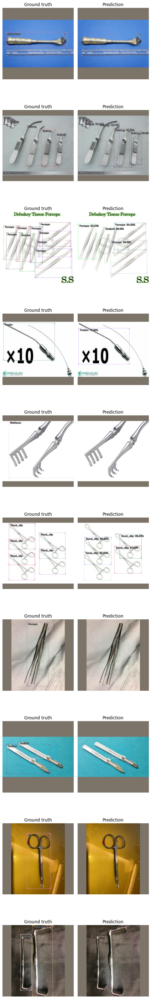

In [48]:
show_preds(preds = preds_saved_test[10:20])


In [52]:
learn.fine_tune(10, 3e-04)

Could not gather input dimensions


epoch,train_loss,valid_loss,COCOMetric,time
0,1.535574,2.110270,0.234372,05:08


/usr/local/lib/python3.7/dist-packages/mmdet/core/anchor/anchor_generator.py:324: UserWarning: ``grid_anchors`` would be deprecated soon. Please use ``grid_priors`` 
  warnings.warn('``grid_anchors`` would be deprecated soon. '
/usr/local/lib/python3.7/dist-packages/mmdet/core/anchor/anchor_generator.py:361: UserWarning: ``single_level_grid_anchors`` would be deprecated soon. Please use ``single_level_grid_priors`` 
  '``single_level_grid_anchors`` would be deprecated soon. '
/usr/local/lib/python3.7/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.7/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.7/dist-packages/PIL/Image.py:976: UserWarning: P

Could not gather input dimensions


epoch,train_loss,valid_loss,COCOMetric,time
0,1.499370,2.165751,0.239109,05:38
1,1.536509,2.026960,0.294920,05:38
2,1.584985,2.072037,0.256661,05:38
3,1.559930,2.065499,0.283162,05:38
4,1.575420,2.072252,0.236220,05:38
5,1.504611,2.152344,0.230294,05:39
6,1.455124,2.121211,0.272005,05:38
7,1.416932,2.183600,0.259146,05:38
8,1.400068,2.164762,0.263308,05:38
9,1.395276,2.175451,0.261156,05:38


/usr/local/lib/python3.7/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.7/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.7/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.7/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.7/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency e

In [ ]:
### consider what to do with retained images
### if model is giving good mAP and inference, do inference using the student model
###    to get pseudolabels, then retrain
### if model not good, annotate more data